#### Author: Adam Van Etten - November 2021

# Notebook for training adversarial patches to fool detectors trained on VisDrone


In [1]:
from shapely.affinity import translate
from shapely.geometry import box
import matplotlib.pyplot as plt
from shapely.wkt import loads
import matplotlib as mpl
import geopandas as gpd
from torch import optim
from imp import reload
from tqdm import tqdm
import pandas as pd 
import numpy as np
import collections
import skimage.io
import operator
import shapely
import random
import shutil
import math
import time
import imp
import cv2
import sys
import os
import gc
from torch import autograd
import torch
import PIL
from torchvision import transforms
# plt.rcParams["axes.grid"] = False
# plt.axis('off')

# camo src
camo_path = '/local_data/cosmiq/src/avanetten/camolo'
sys.path.append(os.path.join(camo_path, 'camolo'))
sys.path.append(os.path.join(camo_path, 'camolo', 'yolt_data_prep'))
# camo_path = '/local_data/cosmiq/src/avanetten/camouflage'
# sys.path.append(os.path.join(camo_path, 'data_prep'))
# sys.path.append(os.path.join(camo_path, 'adversarial-yolt'))
import cowc_yolt_prep
import utils as camo_utils
import prep_train as camo_prep_train
import load_data
import patch_config
import test_patch

# yolt src
yoltv4_path = '/local_data/cosmiq/src/avanetten/yoltv4/'
sys.path.append(os.path.join(yoltv4_path, 'yoltv4'))
# sys.path.append(os.path.join(yoltv4_path, 'yoltv4', 'private'))
import prep_train
import tile_ims_labels
import post_process
# import visdrone_yolt_prep
# import eval
# import eval_errors

# patch data
patch_data_root = '/local_data/cosmiq/src/avanetten/camolo/patches'
# patch_data_root = '/local_data/cosmiq/src/avanetten/camouflage/data/patches'

# set raw dataset path (gpu02)
data_root = '/local_data/cosmiq/wdata/avanetten/VisDrone/data'

# output dirs
train_root = os.path.join(data_root, 'VisDrone2019-DET-train')
val_root = os.path.join(data_root, 'VisDrone2019-DET-val')
test_root = os.path.join(data_root, 'VisDrone2019-DET-test-dev')
exp_name = 'v1_4cat'

## View Pre-Trained Adversarial Patches

patch1_paths: ['/local_data/cosmiq/src/avanetten/camolo/patches/adversarial-yolo/object_upper.png', '/local_data/cosmiq/src/avanetten/camolo/patches/adversarial-yolo/object_score.png', '/local_data/cosmiq/src/avanetten/camolo/patches/adversarial-yolo/class_only.png', '/local_data/cosmiq/src/avanetten/camolo/patches/adversarial-yolo/class_detection.png']
patch2_paths: ['/local_data/cosmiq/src/avanetten/camolo/patches/arxiv_2008.13671/large_patch.png', '/local_data/cosmiq/src/avanetten/camolo/patches/arxiv_2008.13671/small_patch.png', '/local_data/cosmiq/src/avanetten/camolo/patches/arxiv_2008.13671/half_patch_of_two.png', '/local_data/cosmiq/src/avanetten/camolo/patches/arxiv_2008.13671/small_gray_patch.png', '/local_data/cosmiq/src/avanetten/camolo/patches/arxiv_2008.13671/large_side_patch.png']


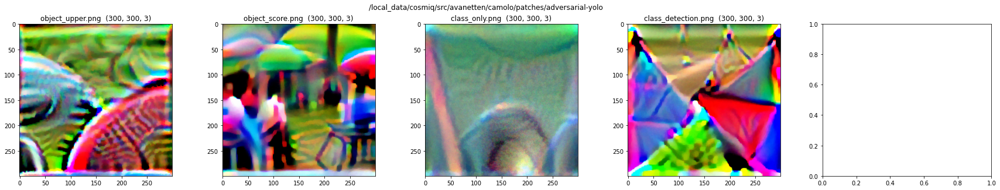

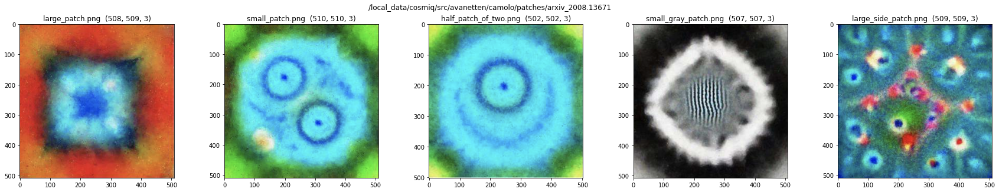

In [2]:
# view patches
patch1_dir = os.path.join(patch_data_root, 'adversarial-yolo')
patch1_paths = [os.path.join(patch1_dir, z) for z in os.listdir(patch1_dir) if z.endswith('.png')]
print("patch1_paths:", patch1_paths)

patch2_dir = os.path.join(patch_data_root, 'arxiv_2008.13671')
patch2_paths = [os.path.join(patch2_dir, z) for z in os.listdir(patch2_dir) if z.endswith('.png')]
print("patch2_paths:", patch2_paths)

# visualize some of the plots
rows, cols = 1, 5
figsize = 6
for paths_tmp in [patch1_paths, patch2_paths]:
    rand_selection = paths_tmp  # random.sample(paths_tmp, rows*cols)
    fig, axes = plt.subplots(nrows=rows, ncols=cols,  figsize=(figsize*cols, 0.8*figsize*rows))
    fig.suptitle(os.path.dirname(paths_tmp[0]))
    for i in range(len(rand_selection)):
    # for i in range(rows*cols):
        ax = axes.flatten()[i]
        im_path_tmp = rand_selection[i]
        im_name_tmp = os.path.basename(im_path_tmp)
        # im = PIL.Image.open(im_path_tmp).convert('RGB')
        im = skimage.io.imread(im_path_tmp)
        ax.imshow(im)
        ax.set_title(im_name_tmp + '  ' + str(im.shape))

## View printable colors

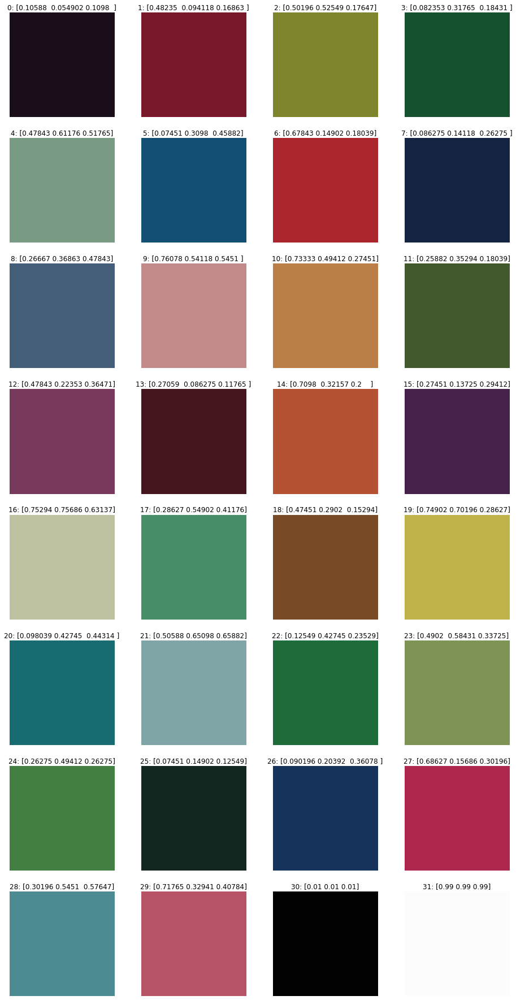

<Figure size 432x288 with 0 Axes>

In [3]:
# View printable colors (see Section 3 of https://arxiv.org/abs/1904.08653 for details on non-printability).

# print_file = os.path.join(camo_path, 'camolo', "non_printability", "cowc_subtle_grays_v1.txt")
# print_file = os.path.join(camo_path,  'camolo', "non_printability", "cowc_subtle_v2.txt")
print_file = os.path.join(camo_path, 'camolo', "non_printability", "cowc_32values.txt")

n_cols = 4
figsize = 4
side = 100
    
# read in printability triplets and put them in a list
df = pd.read_csv(print_file, sep=',', names=('r', 'g', 'b'))  
df_int = df  # 256 * df

# get colors
printability_array = []
for printability_triplet in df_int.values:
    printability_imgs = []
    red, green, blue = printability_triplet
    z = np.zeros((side, side, 3))
    z[:,:, 0] = red
    z[:,:, 1] = green
    z[:,:, 2] = blue
    printability_array.append(z)

# plot
n_rows = int(np.rint((len(df_int) / n_cols) + 0.5))
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols,  figsize=(figsize*n_cols, figsize*n_rows))
for i,p in enumerate(printability_array):
    ax = axes.flatten()[i]
    ax.imshow(p)
    ax.set_title(str(i) + ': ' + str(df_int.values[i]))
    ax.axis('off')
plt.show()
plt.tight_layout()

------
# Train a Patch

## Edit patch_config.py and then run train_patch.py

Use the following weights:

    /local_data/cosmiq/src/avanetten/yoltv4/darknet/backup/
        yolt2_ave_26x26_visdrone_v1_4cat_final.weights

Ensure torch is correctly installed

    import torch
    print(torch.__version__)
    torch.cuda.is_available()

# Launched 03 Oct 2022

    # include patch detection loss term
    ssh gpu02.labs.internal
    docker attach camo_sol_gpu2
    cd /local_data/cosmiq/src/avanetten/camolo/camolo
    python train_patch_v2.py visdrone_patch_detect_v0 visdrone_v1_4cat_obj_only_w0

    # include patch detection loss term
    ssh gpu02.labs.internal
    docker attach camo_sol_gpu0
    cd /local_data/cosmiq/src/avanetten/camolo/camolo
    python train_patch_v2.py visdrone_patch_detect_v0 visdrone_v1_4cat_obj_only_gray_w1

    # include patch detection loss term
    ssh gpu02.labs.internal
    docker attach camo_sol_gpu1
    cd /local_data/cosmiq/src/avanetten/camolo/camolo
    python train_patch_v2.py visdrone_patch_detect_v0 visdrone_v1_4cat_obj_only_w2


# Launched 28 April 2022

    docker attach camo_sol_gpu2
    cd /local_data/cosmiq/src/avanetten/camouflage/adversarial-yolt
    python train_patch.py visdrone_v1_4cat_obj_only_tiny_gray_v1


# Launched 22 April 2022

    docker attach camo_sol_gpu2
    cd /local_data/cosmiq/src/avanetten/camouflage/adversarial-yolt
    python train_patch.py visdrone_v1_4cat_obj_only_tiny_v0
    
    docker attach camo_sol_gpu1
    python train_patch.py visdrone_v1_4cat_obj_only_tiny_gray_v0


# Launched 16 March 2022

    docker attach camo_sol_gpu2
    python train_patch.py visdrone_v1_4cat_class_only_v1

    ...

# View patches

In [4]:
reload(patch_config)
patch_config.patch_configs

{'base': patch_config.BaseConfig,
 'exp1': patch_config.Experiment1,
 'exp1_des': patch_config.Experiment1Desktop,
 'exp2_high_res': patch_config.Experiment2HighRes,
 'exp3_low_res': patch_config.Experiment3LowRes,
 'exp4_class_only': patch_config.Experiment4ClassOnly,
 'paper_obj': patch_config.ReproducePaperObj,
 'cowc_obj_only_v4': patch_config.COWC_obj_only_v4,
 'cowc_obj_only_v3': patch_config.COWC_obj_only_v3,
 'cowc_obj_only_v2': patch_config.COWC_obj_only_v2,
 'cowc_obj_only_v1': patch_config.COWC_obj_only_v1,
 'cowc_obj_only': patch_config.COWC_obj_only,
 'visdrone_obj_only_v0': patch_config.visdrone_obj_only_v0,
 'visdrone_obj_class_v0': patch_config.visdrone_obj_class_v0,
 'visdrone_class_only_v0': patch_config.visdrone_class_only_v0,
 'visdrone_obj_only_small_v0': patch_config.visdrone_obj_only_small_v0,
 'visdrone_obj_only_small_gray_v0': patch_config.visdrone_obj_only_small_gray_v0,
 'visdrone_obj_only_small_gray_v1': patch_config.visdrone_obj_only_small_gray_v1,
 'visdro

In [5]:
# # View grid of latest patches (one plot per config)
# model_list_full = list(patch_config.patch_configs.keys())
# model_list = sorted([z for z in model_list_full if z.startswith('visdrone')])

# # set up plot
# ncols, figsize = 3, 6
# nrows = math.ceil(len(model_list) / ncols)
# fig, axes = plt.subplots(nrows=nrows, ncols=ncols,  figsize=(figsize*ncols, 0.95*figsize*nrows))
    
# for i, model in enumerate(model_list):
#     ax = axes.flatten()[i]
#     config = patch_config.patch_configs[model]()
#     patch_dir = os.path.join(camo_path, 'adversarial-yolt', 'saved_patches', config.patch_name)
#     patch_list = sorted(os.listdir(patch_dir))
#     epochs = [int(z.split('epoch')[-1].split('.')[0]) for z in patch_list if z.endswith('.jpg')]
#     max_epoch = max(epochs)
#     out_patch_path = os.path.join(patch_dir, config.patch_name + '_epoch{}.jpg'.format(str(max_epoch)))
#     im = skimage.io.imread(out_patch_path)
#     ax.imshow(im)
#     ax.set_title('{}: epoch={}'.format(model, max_epoch))

model: visdrone_obj_only_v0
  patch_path: /local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p4_30vals_obj_only_v0/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p4_30vals_obj_only_v0_epoch0.jpg
model: visdrone_obj_class_v0
  patch_path: /local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p4_32vals_obj_class_v0/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p4_32vals_obj_class_v0_epoch0.jpg
model: visdrone_class_only_v0
  patch_path: /local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p4_32vals_class_only_v0/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p4_32vals_class_only_v0_epoch0.jpg
model: visdrone_obj_only_small_v0
  patch_path: /local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p3_30vals_obj_only_small_v0/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p3_30vals_obj_only_small_v0_epoch0.jpg
model: vi

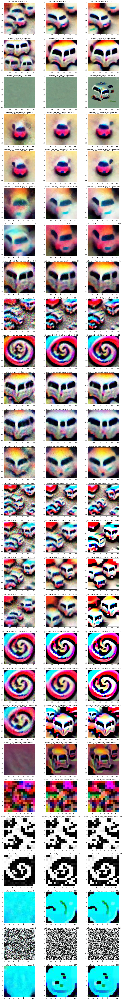

In [6]:
# View grid of latest patches (three plots per config)
model_list_full = list(patch_config.patch_configs.keys())
# model_list = sorted([z for z in model_list_full if z.startswith('visdrone')])
model_list = [z for z in model_list_full if (z.startswith('visdrone') 
                                                    and 'visdrone_patch_detect_v0' not in z)]

# set up plot
ncols, figsize = 3, 6
nrows = len(model_list)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,  figsize=(figsize*ncols, 0.95*figsize*nrows))
    
for i, model in enumerate(model_list):
    ax_row = axes[i]
    config = patch_config.patch_configs[model]()
    patch_dir = os.path.join(camo_path, 'saved_patches', config.patch_name)
    # patch_dir = os.path.join(camo_path, 'adversarial-yolt', 'saved_patches', config.patch_name)
    patch_list = sorted(os.listdir(patch_dir))
    epochs = [int(z.split('epoch')[-1].split('.')[0]) for z in patch_list if z.endswith('.jpg')]
    max_epoch = max(epochs)
    for j, epoch in enumerate([0, int(max_epoch/2), max_epoch]):
        out_patch_path = os.path.join(patch_dir, config.patch_name + '_epoch{}.jpg'.format(str(epoch)))
        if j == 0:
            print("model:", model)
            print("  patch_path:", out_patch_path)
        im = skimage.io.imread(out_patch_path)
        ax = ax_row[j]
        ax.imshow(im)
        ax.set_title('{}: epoch={}'.format(model, epoch))

model_list: ['visdrone_obj_only_v0', 'visdrone_obj_class_v0', 'visdrone_class_only_v0', 'visdrone_obj_only_small_v0', 'visdrone_obj_only_small_gray_v0', 'visdrone_obj_only_small_gray_v1', 'visdrone_v1_4cat_obj_only_small_v1', 'visdrone_v1_4cat_obj_class_small_v2', 'visdrone_v1_4cat_obj_only_v2', 'visdrone_v1_4cat_obj_only_gray_v2', 'visdrone_v1_4cat_obj_class_v3', 'visdrone_v1_4cat_obj_class_v4', 'visdrone_v1_4cat_obj_only_v4', 'visdrone_v1_4cat_obj_only_v5', 'visdrone_v1_4cat_obj_only_v5p1', 'visdrone_v1_4cat_obj_only_v5p2', 'visdrone_v1_4cat_obj_only_v5p3', 'visdrone_v1_4cat_obj_only_gray_v2p1', 'visdrone_v1_4cat_obj_only_gray_v2p2', 'visdrone_v1_4cat_obj_only_gray_v2p3', 'visdrone_v1_4cat_class_only_v1', 'visdrone_v1_4cat_obj_only_tiny_v0', 'visdrone_v1_4cat_obj_only_tiny_gray_v0', 'visdrone_v1_4cat_obj_only_tiny_gray_v1', 'visdrone_v1_4cat_obj_only_w0', 'visdrone_v1_4cat_obj_only_gray_w1', 'visdrone_v1_4cat_obj_only_w2']
len model_list: 27
 & Name & Loss & Size & Alpha \\
1 & obj\_

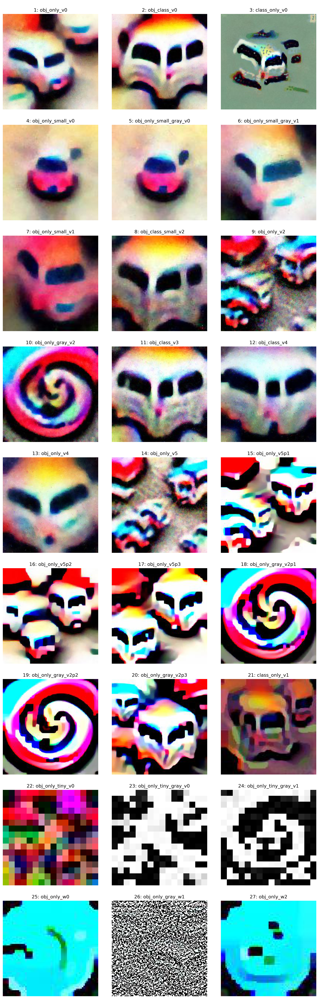

In [7]:
# View grid of latest patches, and plot patch params
import inspect
plt.rcParams['figure.dpi'] = 300

model_list_full = list(patch_config.patch_configs.keys())
#model_list = [z for z in model_list_full if z.startswith('visdrone')]
model_list = [z for z in model_list_full if (z.startswith('visdrone') 
                                                    and 'visdrone_patch_detect_v0' not in z)]
print("model_list:", model_list)
print("len model_list:", len(model_list))

# set up plot
ncols, figsize = 3, 4
nrows = int(len(model_list) / ncols)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,  figsize=(figsize*ncols, 0.99*figsize*nrows))
    
sep = " & "
sep2 = ""
header = sep + "Name" + sep +  "Loss" + sep + "Size" + sep + "Alpha" + r" \\"
print(header)

for i, model in enumerate(model_list):
    print_name = model.split("visdrone_")[-1].split("v1_4cat_")[-1]
    print_name_tab = print_name.replace(r'_', r'\_')
    c = patch_config.patch_configs[model]()
    patch_dir = os.path.join(camo_path, 'saved_patches', c.patch_name)
    # patch_dir = os.path.join(camo_path, 'adversarial-yolt', 'saved_patches', config.patch_name)
    patch_list = sorted(os.listdir(patch_dir))
    epochs = [int(z.split('epoch')[-1].split('.')[0]) for z in patch_list if z.endswith('.jpg')]
    max_epoch = max(epochs)
    out_patch_path = os.path.join(patch_dir, c.patch_name + '_epoch{}.jpg'.format(str(max_epoch)))
    im = skimage.io.imread(out_patch_path)
    ax = axes.flatten()[i]
    ax.imshow(im)
    ax.set_title("\n" + str(i + 1) + ": " + print_name)
    ax.axis('off')
    # ax.set_title('{}: epoch={}'.format(model, epoch))    
    
    # plot details
    func = c.loss_target
    loss_str = inspect.getsource(func).split(": ")[-1].strip()
    tab_row = str(i+1) + sep + print_name_tab + sep + loss_str + sep \
              + "$" + str(c.target_size_frac) + "$" + sep \
              + "$" + str(c.patch_alpha) + "$" + r" \\"
    print(tab_row)

plt.tight_layout()
plt.savefig('patch_grid.png')

In [8]:
# Select model
# model = "visdrone_v1_4cat_obj_only_small_v1"
# model = "visdrone_v1_4cat_class_only_v1"
# model = "visdrone_v1_4cat_obj_only_gray_v2p1"
# model = 'visdrone_v1_4cat_obj_only_tiny_gray_v1'
model = 'visdrone_v1_4cat_obj_only_w0'

names_file = os.path.join(test_root, 'yolt', exp_name, 'txt', 'visdrone_v1_4cat.names')

reload(load_data)
reload(patch_config)
from load_data import *
mpl.rcParams['figure.dpi'] = 300

config = patch_config.patch_configs[model]()
print("model:", model)
print("config.alpha:", config.patch_alpha)
print("config.target_size_frac:", config.target_size_frac)

patch_dir = os.path.join(camo_path,  'saved_patches', config.patch_name)
#patch_dir = os.path.join(camo_path, 'adversarial-yolt', 'saved_patches', config.patch_name)
patch_list = sorted(os.listdir(patch_dir))
display(patch_list)
epochs = [int(z.split('epoch')[-1].split('.')[0]) for z in patch_list if z.endswith('.jpg')]
max_epoch = max(epochs)
print("max_epoch:", max_epoch)

model: visdrone_v1_4cat_obj_only_w0
config.alpha: 0.6
config.target_size_frac: 0.25


['patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch0.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch1.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch10.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch100.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch101.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch102.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch103.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch104.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch105.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch106.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch107.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch108.jpg',
 'patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch109.jpg',
 'patch_yolt2_ave

max_epoch: 451


out_patch_path: /local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0/patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch0.jpg
out_patch_path: /local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0/patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch66.jpg
out_patch_path: /local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0/patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch132.jpg


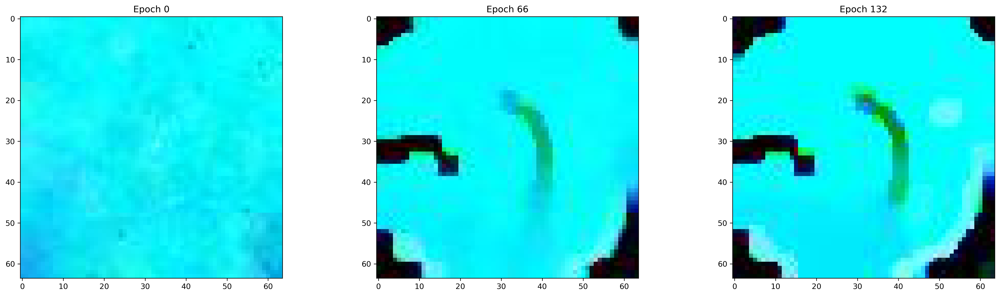

In [8]:
# plot first, middle, last patches
epochs = [0, int(max_epoch/2), max_epoch]
ncols, figsize = 3, 8
nrows = 1
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,  figsize=(figsize*ncols, 0.8*figsize*nrows))
for i, epoch in enumerate(epochs):
    ax = axes.flatten()[i]
    # plot
    out_patch_path = os.path.join(patch_dir, config.patch_name + '_epoch{}.jpg'.format(str(epoch)))
    print("out_patch_path:", out_patch_path)
    im = skimage.io.imread(out_patch_path)
    ax.imshow(im)
    ax.set_title('Epoch {}'.format(epoch))

In [13]:
# Test/score patch (slowwwwww) [Should run this in a terminal, not the notebook]
# docker attach camo_sol
# conda activate solaris
# ipython

from imp import reload
import sys
import os

# camo src
camo_path = '/local_data/cosmiq/src/avanetten/camolo'
sys.path.append(os.path.join(camo_path, 'camolo'))
sys.path.append(os.path.join(camo_path, 'camolo', 'yolt_data_prep'))
import cowc_yolt_prep
import utils as camo_utils
import prep_train as camo_prep_train
import load_data
import patch_config
import test_patch
reload(test_patch)

models_of_interest = [
    'visdrone_v1_4cat_obj_only_w0',
    'visdrone_v1_4cat_obj_only_gray_w1',
    'visdrone_v1_4cat_obj_only_w2'
#     'visdrone_obj_class_v0',
#     'visdrone_obj_only_small_v0',
#     'visdrone_obj_only_v0',
#     'visdrone_v1_4cat_obj_class_v3',
#     'visdrone_v1_4cat_obj_only_gray_v2p2',
#     'visdrone_v1_4cat_obj_only_gray_v2p3',
#     'visdrone_v1_4cat_obj_only_small_v1',
#     'visdrone_v1_4cat_obj_only_v4',
#     'visdrone_v1_4cat_obj_only_v5',
#     'visdrone_v1_4cat_obj_only_v5p3'
]

# set raw dataset path (gpu02)
data_root = '/local_data/cosmiq/wdata/avanetten/VisDrone/data'
train_root = os.path.join(data_root, 'VisDrone2019-DET-train')
val_root = os.path.join(data_root, 'VisDrone2019-DET-val')
test_root = os.path.join(data_root, 'VisDrone2019-DET-test-dev')
exp_name = 'v1_4cat'

img_dir_v = os.path.join(test_root, 'yolt', exp_name, 'images')
lab_dir_v = os.path.join(test_root, 'yolt', exp_name, 'labels')

max_ims=1000
conf_thresh=0.4
nms_thresh=0.4
save_images = False
verbose = False  # True
super_verbose = False

for model_tmp in models_of_interest:

    savedir =  os.path.join(camo_path, 'patch_test', model_tmp)
    config = patch_config.patch_configs[model_tmp]()
    # patch_dir = os.path.join(camo_path,  'saved_patches', config.patch_name, 'patch_test')

    if os.path.exists(savedir):
        print("Output {} alredy exists, skipping!".format(savedir))
        continue
    else:
        os.makedirs(savedir)
    
    # get patchfile
    # config = patch_config.patch_configs[model]()
    cls_id = config.cls_id
    # print("config:", config)
    patch_dir = os.path.join(camo_path,  'saved_patches', config.patch_name)
    #patch_dir = os.path.join(camo_path, 'adversarial-yolt', 'saved_patches', config.patch_name)
    patch_list = sorted(os.listdir(patch_dir))
    epochs = [int(z.split('epoch')[-1].split('.')[0]) for z in patch_list if z.endswith('.jpg')]
    max_epoch = max(epochs)
    patchfile = os.path.join(camo_path, 'saved_patches', 
                                  config.patch_name, config.patch_name + '_epoch{}.jpg'.format(str(max(epochs))))
    print("model:", model_tmp)
    print("cls_id:", cls_id)
    print("alpha:", config.patch_alpha)
    print("target_size_frac:", config.target_size_frac)
    print("img_dir:", img_dir_v)
    print("patchfile:", patchfile)
    print("savedir:", savedir)

    test_patch.test(img_dir_v, model_tmp, patchfile, savedir, 
                    conf_thresh=conf_thresh, nms_thresh=nms_thresh,
                    cls_id=cls_id,
                    save_images=save_images, max_ims=max_ims,
                    verbose=verbose, super_verbose=super_verbose)

Output /local_data/cosmiq/src/avanetten/camolo/patch_test/visdrone_v1_4cat_obj_only_w0 alredy exists, skipping!
Output /local_data/cosmiq/src/avanetten/camolo/patch_test/visdrone_v1_4cat_obj_only_gray_w1 alredy exists, skipping!
Output /local_data/cosmiq/src/avanetten/camolo/patch_test/visdrone_v1_4cat_obj_only_w2 alredy exists, skipping!


model: visdrone_v1_4cat_obj_only_w0
alpha: 0.6
target_size_frac: 0.25
config: <patch_config.visdrone_v1_4cat_obj_only_w0 object at 0x7ff2ec3d0490>
patch_path: /local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0/patch_yolt2_ave_26x26_alpha06_visdrone_v1_4cat_obj_only_w0_epoch42.jpg
adv_patch.shape: torch.Size([3, 64, 64])
LOADING MODELS
Loading weights for adversarial-yolt: /local_data/cosmiq/src/avanetten/camolo/weights/VisDrone/yolt2_ave_26x26_visdrone_v1_4cat_final.weights
  Darknet weight header: major 0, minor 2, revision 5, seen 3840000
MODELS LOADED


/opt/conda/envs/solaris/lib/python3.7/site-packages/torch/nn/functional.py:3448: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "
/opt/conda/envs/solaris/lib/python3.7/site-packages/torch/nn/functional.py:3385: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


Patch applied:
Patch applied:


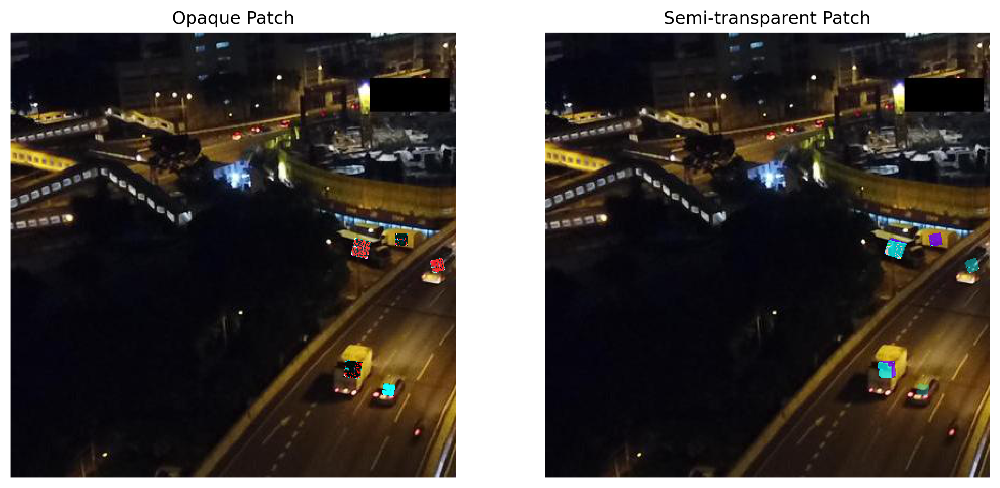

Patch applied:
Patch applied:


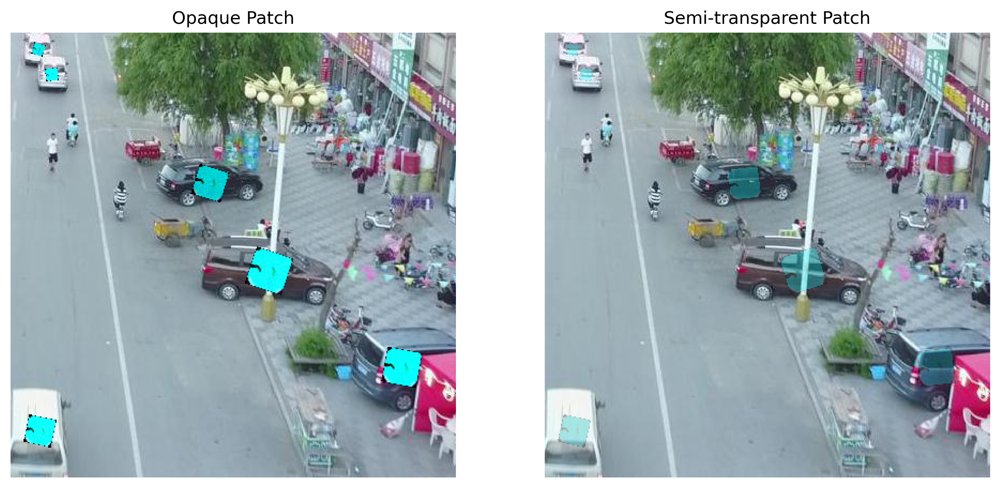

<Figure size 1800x1200 with 0 Axes>

In [14]:
# Apply patch and visualize (for paper), load both alpha and non-alpha model

# Load patch and data
model = 'visdrone_v1_4cat_obj_only_w0' #'visdrone_v1_4cat_class_only_v1'
alpha_tmp = 0.3

epoch = max_epoch
n_plots = 2
img_dir_v = os.path.join(test_root, 'yolt', exp_name, 'images')
lab_dir_v = os.path.join(test_root, 'yolt', exp_name, 'labels')
batch_size = 8
conf_thresh = 0.5
mpl.rcParams['figure.dpi'] = 300

reload(camo_utils)
reload(load_data)
reload(patch_config)
from load_data import *

config = patch_config.patch_configs[model]()
print("model:", model)
print("alpha:", config.patch_alpha)
print("target_size_frac:", config.target_size_frac)

print("config:", config)
out_patch_path = os.path.join(camo_path, #'adversarial-yolt', 
                              'saved_patches', 
                              config.patch_name, config.patch_name + '_epoch{}.jpg'.format(str(epoch)))
# out_patch_path = '/local_data/cosmiq/src/avanetten/camolo/patches/adversarial-yolo/class_detection.png'

print("patch_path:", out_patch_path)
adv_patch = PIL.Image.open(out_patch_path).convert('RGB')
transform = transforms.ToTensor()
adv_patch = transform(adv_patch).cuda()
print("adv_patch.shape:", adv_patch.shape)
patch_size = adv_patch.shape[1]

print('LOADING MODELS')
darknet_model = load_data.Darknet(config.cfgfile)
img_size = darknet_model.height
darknet_model.load_weights(config.weightfile)
darknet_model = darknet_model.eval().cuda()
patch_applier = load_data.PatchApplier(patch_alpha=alpha_tmp).cuda()  #config.patch_alpha).cuda()
patch_applier2 = load_data.PatchApplier(patch_alpha=1).cuda()
patch_transformer = load_data.PatchTransformer(target_size_frac=config.target_size_frac).cuda()
prob_extractor = load_data.MaxProbExtractor(config.cls_id, config.num_cls, config).cuda()
nps_calculator = load_data.NPSCalculator(config.printfile, config.patch_size)
nps_calculator = nps_calculator.cuda()
total_variation = load_data.TotalVariation().cuda()
print('MODELS LOADED')

verbose = True
super_verbose = False #True
test_loader2 = torch.utils.data.DataLoader(load_data.CamoDataset(img_dir_v, lab_dir_v, config.max_lab, 
                                                                 img_size, shuffle=False),
                                              batch_size=1,
                                              shuffle=True,
                                              num_workers=10)

for i_batch, (img_batch, lab_batch) in enumerate(test_loader2):
    if i_batch >= n_plots:
        break
    img_size = img_batch.size(-1)
    class_names = camo_utils.load_class_names(names_file)
    
    lab_batch_filt = lab_batch

    # patch applied with alpha = 1
    adv_batch_t = patch_transformer(adv_patch, lab_batch_filt.cuda(), img_size, do_rotate=True, rand_loc=False)
    p_img = patch_applier2(img_batch.cuda(), adv_batch_t)
    p_img = torch.nn.functional.interpolate(p_img, (darknet_model.height, darknet_model.width))
    # output = darknet_model(p_img)
    # boxes = camo_utils.get_region_boxes(output, conf_thresh, darknet_model.num_classes, 
    #                      darknet_model.anchors, darknet_model.num_anchors)[0]
    # boxes = camo_utils.nms(boxes, 0.4)
    squeezed = p_img.squeeze(0)
    img = transforms.ToPILImage('RGB')(squeezed.detach().cpu())
    if verbose:
        print("Patch applied:")
    plotted_image = img # camo_utils.plot_boxes(img, boxes, class_names=class_names, verbose=verbose)

    # patch applied with alpha < 1
    adv_batch_t = patch_transformer(adv_patch, lab_batch_filt.cuda(), img_size, do_rotate=True, rand_loc=False)
    p_img = patch_applier(img_batch.cuda(), adv_batch_t)
    p_img = torch.nn.functional.interpolate(p_img, (darknet_model.height, darknet_model.width))
    # output = darknet_model(p_img)
    # boxes = camo_utils.get_region_boxes(output, conf_thresh, darknet_model.num_classes, 
    #                      darknet_model.anchors, darknet_model.num_anchors)[0]
    # boxes = camo_utils.nms(boxes, 0.4)
    squeezed = p_img.squeeze(0)
    p_img = transforms.ToPILImage('RGB')(squeezed.detach().cpu())
    if verbose:
        print("Patch applied:")
    plotted_image2 = p_img # camo_utils.plot_boxes(img, boxes, class_names=class_names, verbose=verbose)

     # plot
    nrows, ncols, figsize = 1, 2, 6
    fig, (ax0, ax1) = plt.subplots(nrows=nrows, ncols=ncols,  figsize=(figsize*ncols, 0.999*figsize*nrows))
    ax0.imshow(plotted_image)
    ax0.set_title('Opaque Patch')
    ax0.axis('off')
    ax1.imshow(plotted_image2)
    ax1.set_title('Semi-transparent Patch')
    ax1.axis('off')

    plt.show()
    
plt.tight_layout()